In [1]:
suppressMessages(library(ggplot2))
suppressMessages(library(ArchR))
suppressMessages(library(Seurat))
suppressMessages(library(Signac))
suppressMessages(library(purrr))
suppressMessages(library(readr))
suppressMessages(library(patchwork))
suppressMessages(library(BSgenome.Hsapiens.UCSC.hg38))
suppressMessages(library(dplyr))
suppressMessages(library(cowplot))
suppressMessages(library(ggrepel))
suppressMessages(library(rhdf5))
suppressMessages(library(chromVARmotifs))

In [2]:
set.seed(42)
addArchRThreads(threads = 64)

Setting default number of Parallel threads to 64.



In [3]:
proj <- loadArchRProject("./ArchRProject_CD4", showLogo = FALSE)

Successfully loaded ArchRProject!



In [4]:
proj <- addImputeWeights(proj)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-375eca7e1138b6-Date-2025-04-21_Time-09-31-21.401691.log
If there is an issue, please report to github with logFile!

2025-04-21 09:31:21.842137 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.

Filtering 1 dims correlated > 0.75 to log10(depth + 1)



In [5]:
proj <- addHarmony(
    ArchRProj = proj,
    reducedDims = "IterativeLSI",
    name = "Harmony_CD4",
    groupBy = "Sample",
    force = TRUE
)

Filtering 1 dims correlated > 0.75 to log10(depth + 1)



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



In [6]:
proj <- addUMAP(
    ArchRProj = proj,
    reducedDims = "Harmony_CD4",
    name = "UMAP_CD4",
    nNeighbors = 45,   # 默认是 15，可以尝试 30 或更大
    minDist = 0.05,     # 默认是 0.1，可以尝试 0.05 或更小
    metric = "cosine",  # 可以尝试不同的距离度量，如 "euclidean", "manhattan"
    force = TRUE
)

09:31:39 UMAP embedding parameters a = 1.75 b = 0.8421



09:31:39 Read 5501 rows and found 29 numeric columns

09:31:39 Using Annoy for neighbor search, n_neighbors = 45

09:31:39 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

09:31:40 Writing NN index file to temp file /tmp/RtmpjevAh4/file375eca4f920cb1

09:31:40 Searching Annoy index using 48 threads, search_k = 4500

09:31:40 Annoy recall = 100%

09:31:42 Commencing smooth kNN distance calibration using 48 threads
 with target n_neighbors = 45

09:31:44 Initializing from normalized Laplacian + noise (using RSpectra)

09:31:44 Commencing optimization for 500 epochs, with 363464 positive edges

09:31:44 Using rng type: pcg

09:31:57 Optimization finished

09:31:57 Creating temp model dir /tmp/RtmpjevAh4/dir375eca2c4975dc

09:31:57 Creating dir /tmp/RtmpjevAh4/dir375eca2c49

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca78b4749c-Date-2025-04-21_Time-09-31-58.54981.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca78b4749c-Date-2025-04-21_Time-09-31-58.54981.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca27df09c4-Date-2025-04-21_Time-09-32-02.71424.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca27df09c4-Date-2025-04-21_Time-09-32-02.71424.log



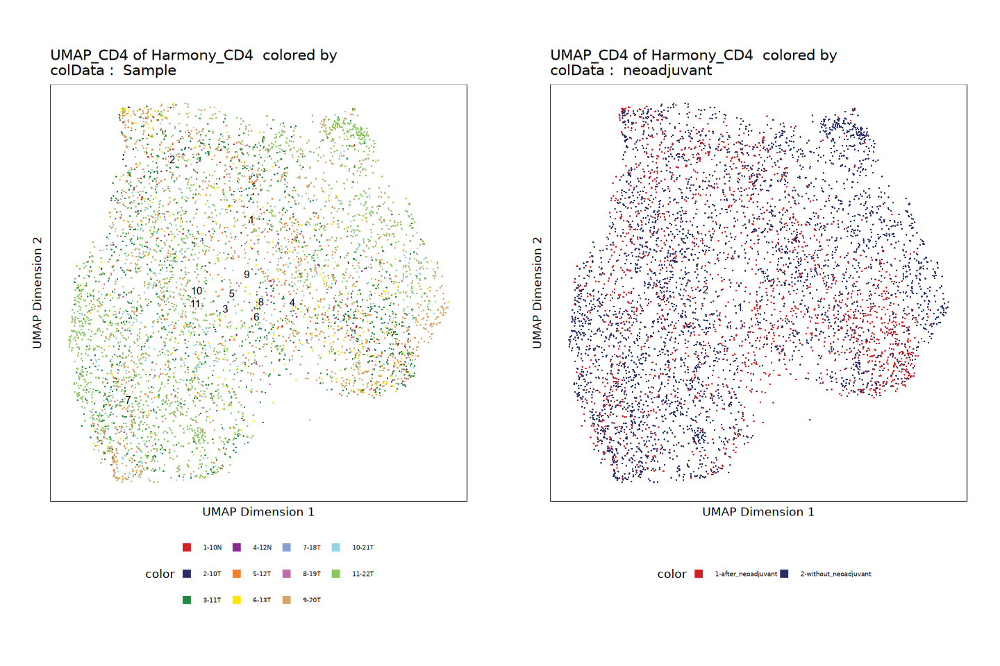

In [7]:
options(repr.plot.height = 8, repr.plot.width = 12)
p1 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "Sample", 
    embedding = "UMAP_CD4"
    )
p2 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "neoadjuvant", 
    embedding = "UMAP_CD4"
    )
ggAlignPlots(p1, p2, type = "h")

In [8]:
proj <- addClusters(proj, name = "clusters_CD4", resolution = 1.5, force = TRUE)

ArchR logging to : ArchRLogs/ArchR-addClusters-375eca5385202e-Date-2025-04-21_Time-09-32-10.272285.log
If there is an issue, please report to github with logFile!



Overriding previous entry for clusters_CD4

Filtering 1 dims correlated > 0.75 to log10(depth + 1)

2025-04-21 09:32:10.874067 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.007 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5501
Number of edges: 192890

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7040
Number of communities: 17
Elapsed time: 0 seconds


2025-04-21 09:32:22.026999 : Testing Outlier Clusters, 0.193 mins elapsed.

2025-04-21 09:32:22.036091 : Assigning Cluster Names to 17 Clusters, 0.193 mins elapsed.

2025-04-21 09:32:22.172715 : Finished addClusters, 0.195 mins elapsed.



In [9]:
table(proj$clusters_CD4)


 C1 C10 C11 C12 C13 C14 C15 C16 C17  C2  C3  C4  C5  C6  C7  C8  C9 
400 281 427 345 249 246 242 508 115 283 283 307 335 470 251 269 490 

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca6b221716-Date-2025-04-21_Time-09-32-22.243895.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca6b221716-Date-2025-04-21_Time-09-32-22.243895.log



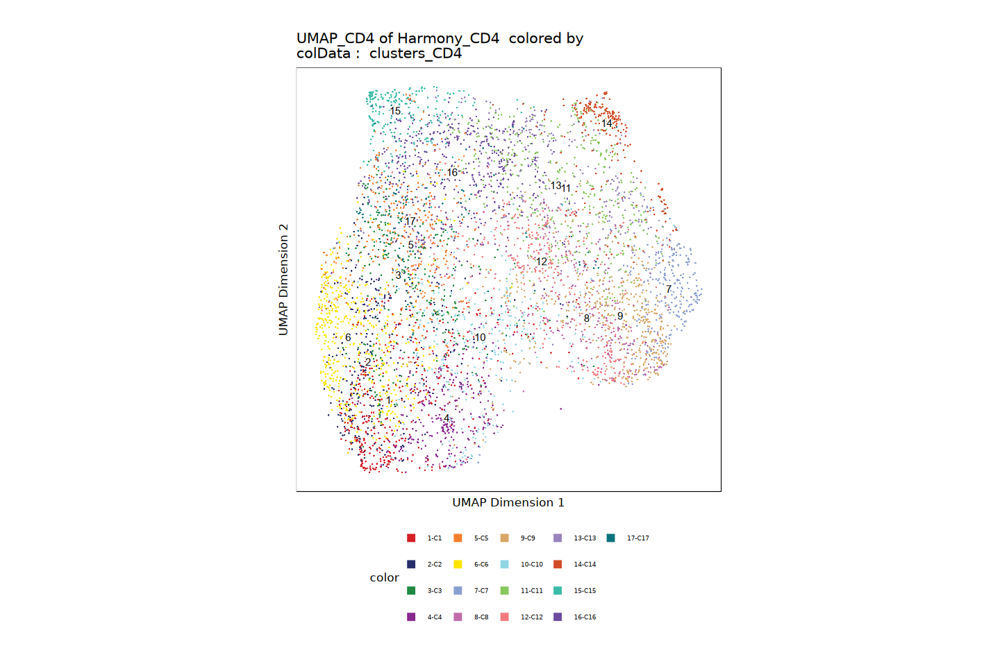

In [10]:
p1 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "clusters_CD4", 
    embedding = "UMAP_CD4"
    )
p1

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca7ea9dacb-Date-2025-04-21_Time-09-32-25.641108.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:32:26.07075 : 



Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca7ea9dacb-Date-2025-04-21_Time-09-32-25.641108.log

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.”


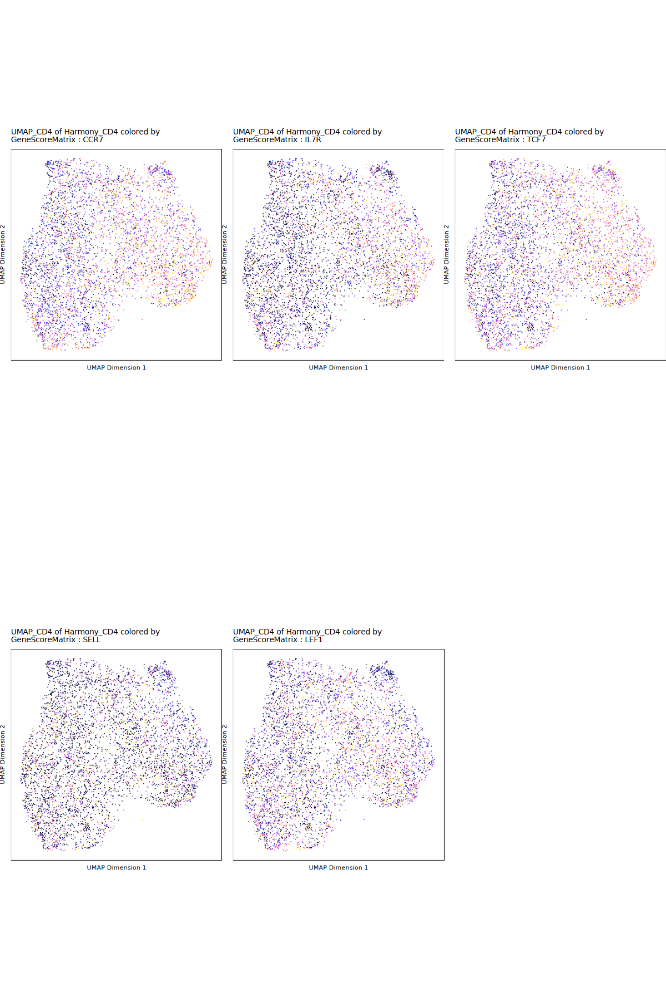

In [11]:
# Tn
markerGenes <- c(
  "CCR7", "IL7R", "TCF7", "SELL", "LEF1"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca5c6861f8-Date-2025-04-21_Time-09-32-53.283507.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:32:53.582496 : 



Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca5c6861f8-Date-2025-04-21_Time-09-32-53.283507.log



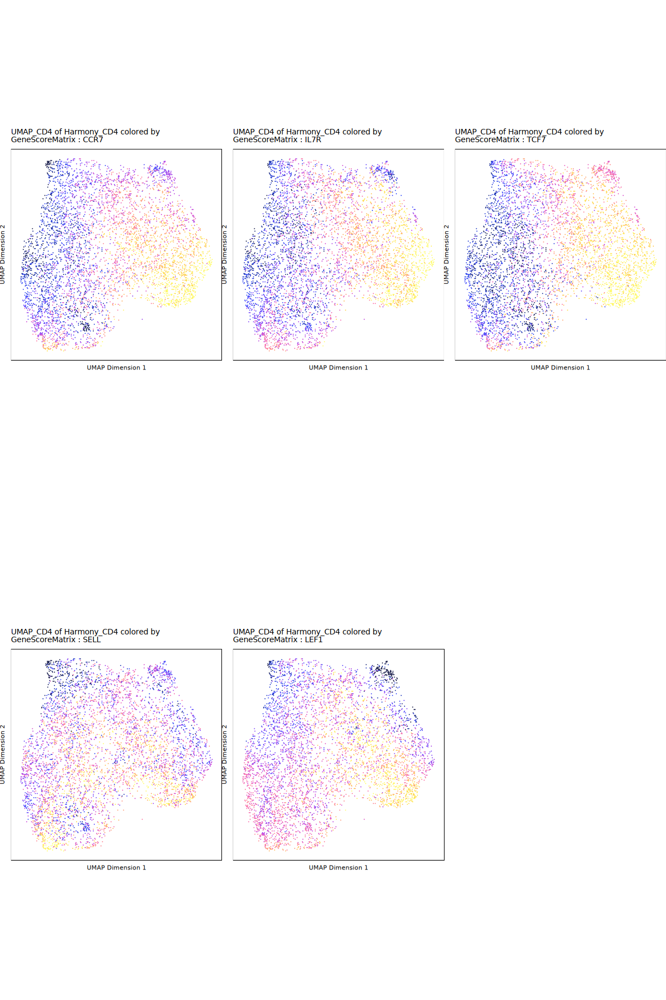

In [12]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca5632960-Date-2025-04-21_Time-09-33-13.872772.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:33:14.183066 : 



Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca5632960-Date-2025-04-21_Time-09-33-13.872772.log



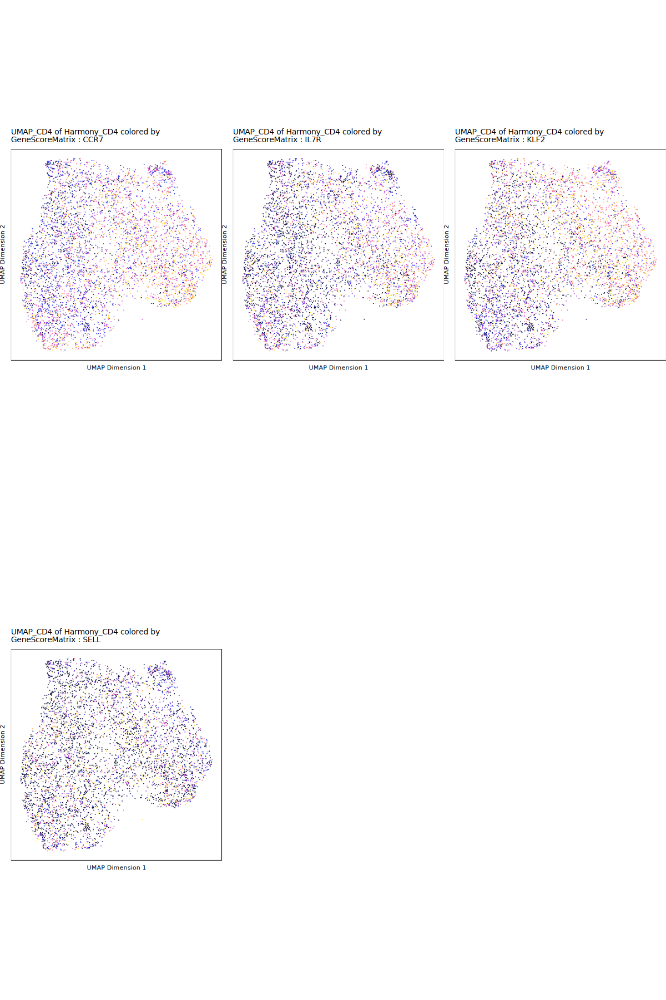

In [13]:
# Tcm
markerGenes <- c(
  "CCR7", "IL7R", "KLF2", "SELL"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca479fc4-Date-2025-04-21_Time-09-33-29.917908.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:33:30.358739 : 



Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca479fc4-Date-2025-04-21_Time-09-33-29.917908.log



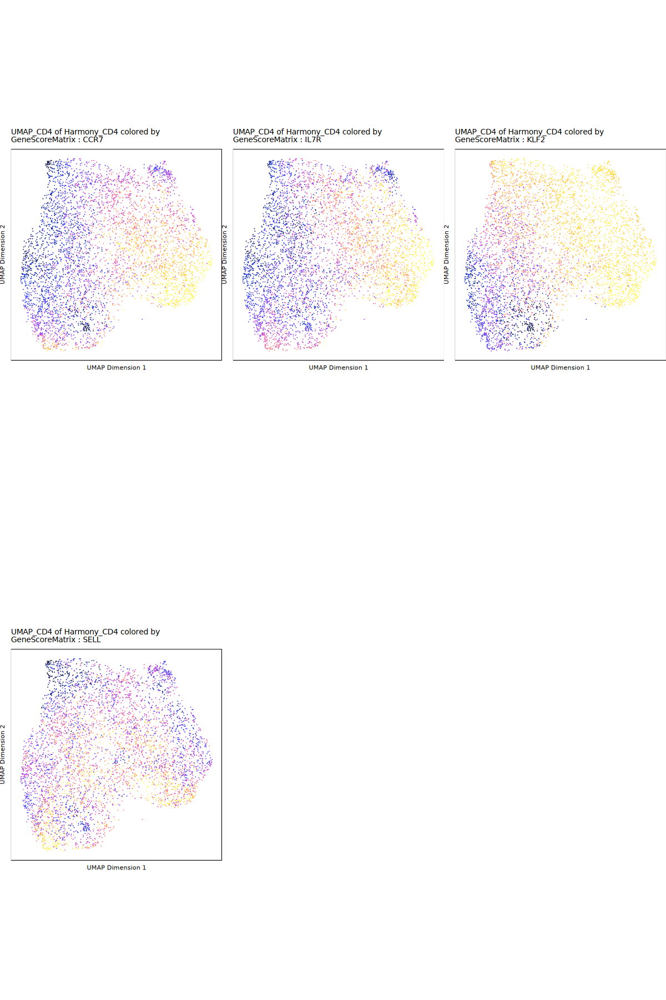

In [14]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca388f4679-Date-2025-04-21_Time-09-33-45.82762.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:33:46.424584 : 



Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca388f4679-Date-2025-04-21_Time-09-33-45.82762.log



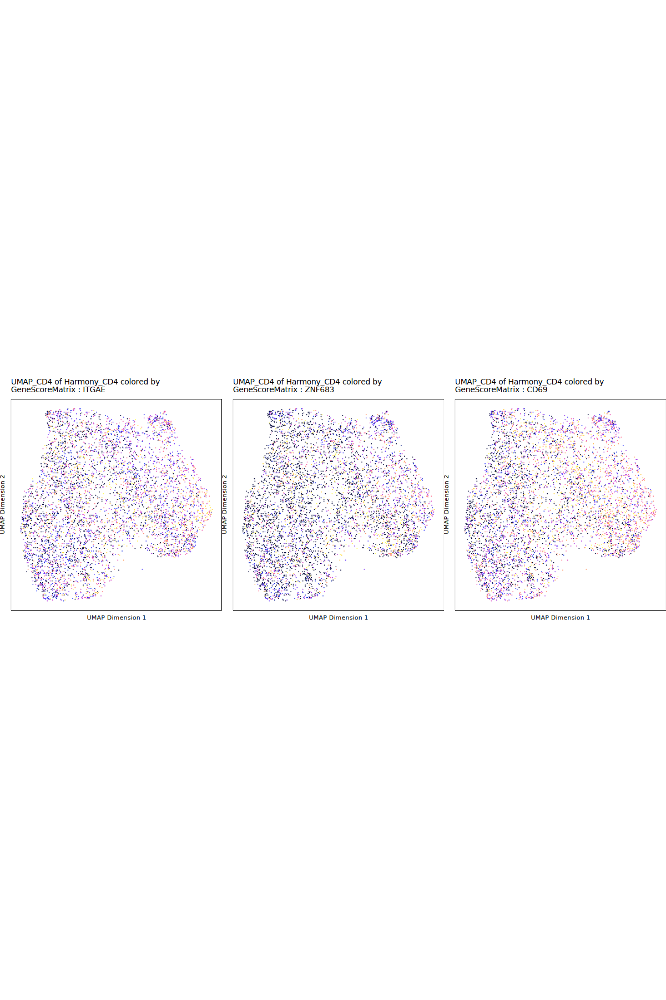

In [15]:
# Trm
markerGenes <- c(
  "ITGAE", "ZNF683", "CD69"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca229b557a-Date-2025-04-21_Time-09-33-57.311229.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:33:57.636545 : 



Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca229b557a-Date-2025-04-21_Time-09-33-57.311229.log



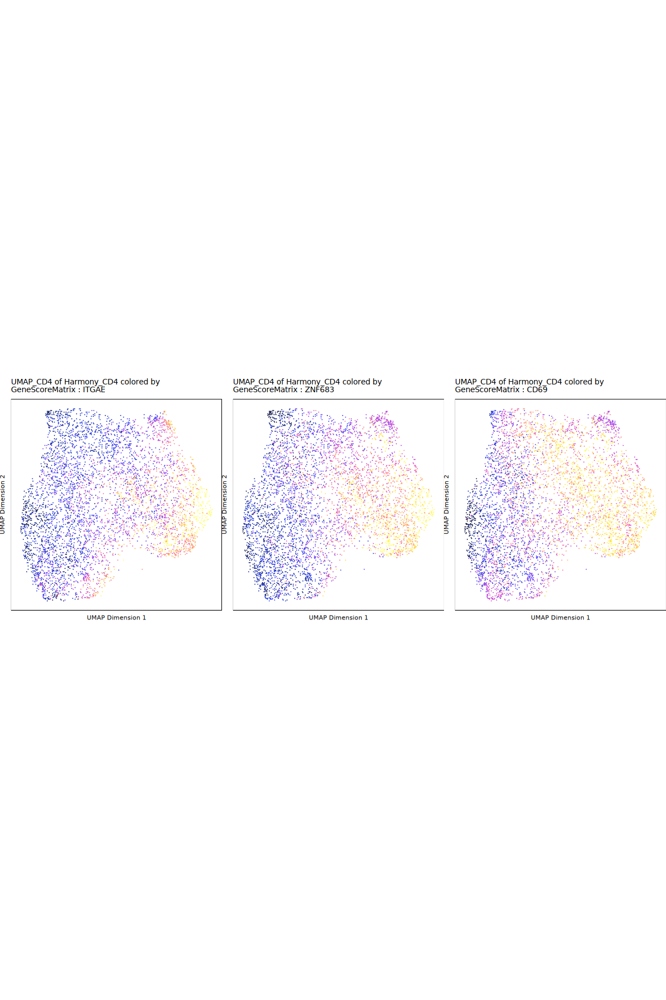

In [16]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca2b65736e-Date-2025-04-21_Time-09-34-10.99453.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:34:11.456467 : 



Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca2b65736e-Date-2025-04-21_Time-09-34-10.99453.log



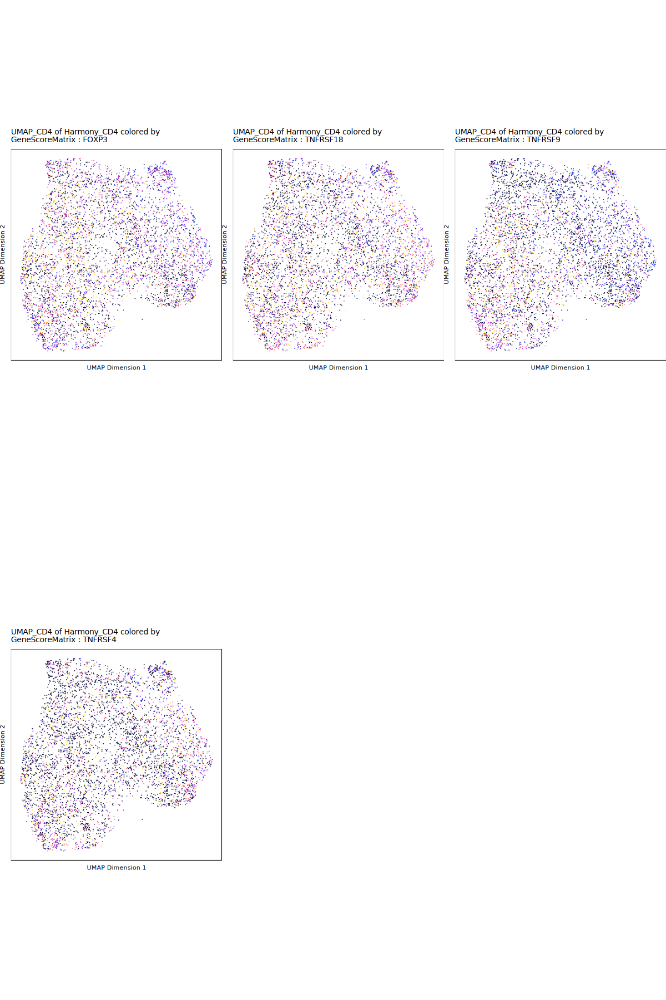

In [17]:
# Treg
markerGenes <- c(
  "FOXP3", "TNFRSF18", "TNFRSF9", "TNFRSF4"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca5642ac4f-Date-2025-04-21_Time-09-34-22.057325.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:34:22.523075 : 



Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca5642ac4f-Date-2025-04-21_Time-09-34-22.057325.log



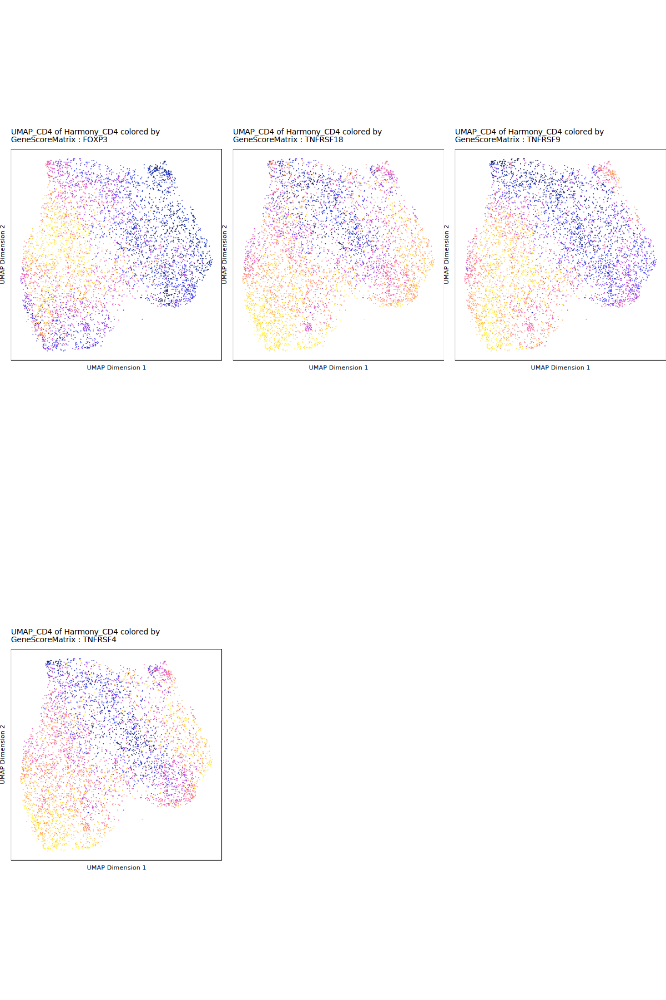

In [18]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375ecad0e5a13-Date-2025-04-21_Time-09-34-35.291065.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:34:35.780867 : 



Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375ecad0e5a13-Date-2025-04-21_Time-09-34-35.291065.log



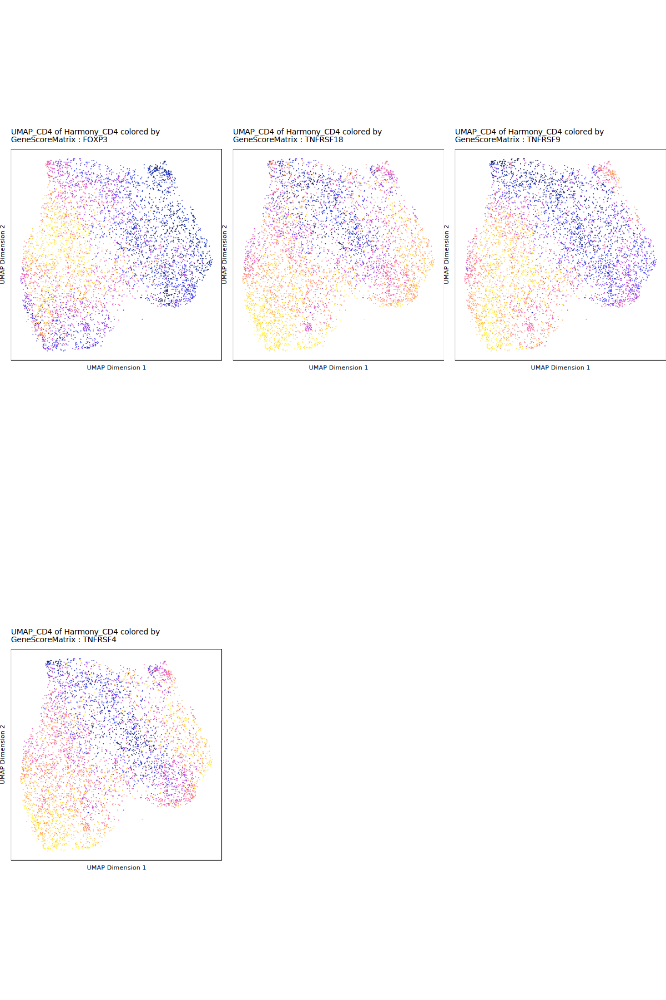

In [19]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca43021397-Date-2025-04-21_Time-09-34-50.101856.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:34:50.488609 : 



Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca43021397-Date-2025-04-21_Time-09-34-50.101856.log



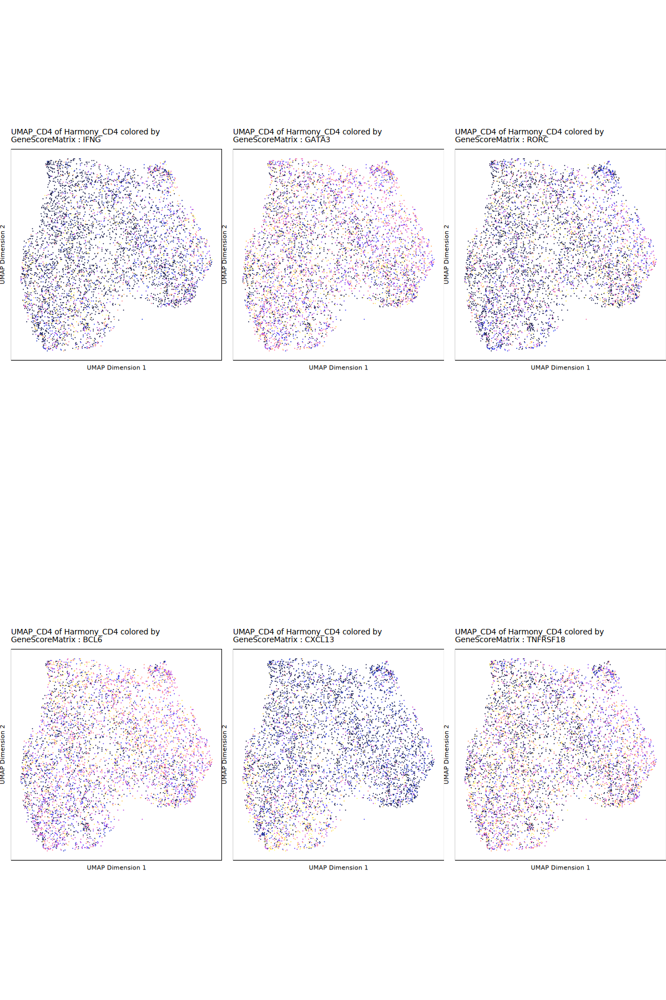

In [20]:
# Th
markerGenes <- c(
  "IFNG", "GATA3", "RORC", "BCL6", "CXCL13", "TNFRSF18"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca3fe6655e-Date-2025-04-21_Time-09-35-06.32143.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:35:06.781698 : 



Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca3fe6655e-Date-2025-04-21_Time-09-35-06.32143.log



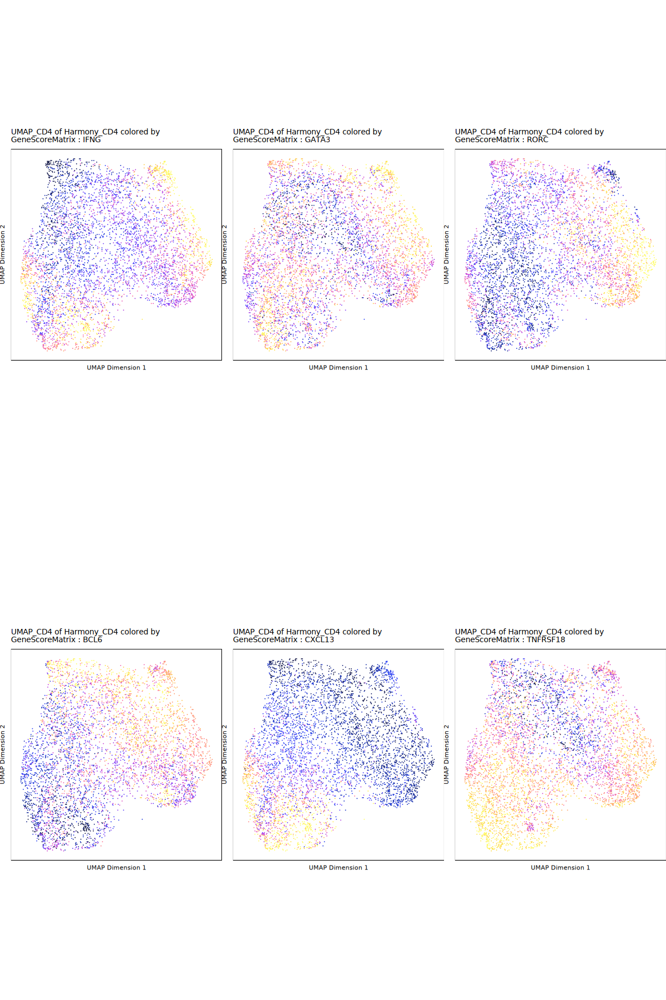

In [21]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca5a96a6f-Date-2025-04-21_Time-09-35-26.818198.log
If there is an issue, please report to github with logFile!



Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:35:27.442038 : 



Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca5a96a6f-Date-2025-04-21_Time-09-35-26.818198.log



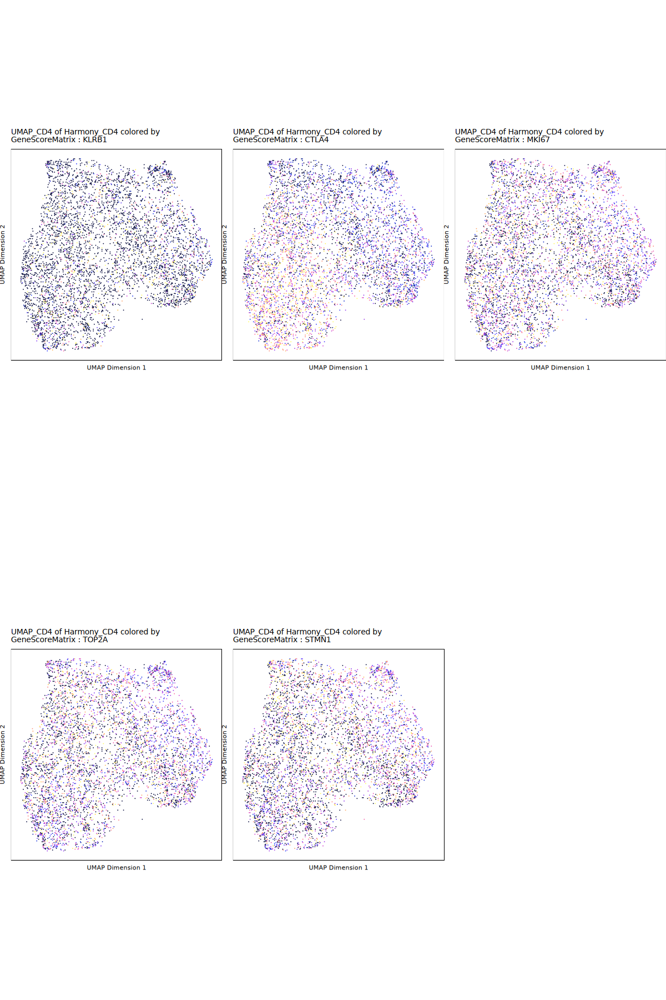

In [22]:
# 增殖相关
markerGenes <- c(
  "KLRB1", "CTLA4", 
  "MKI67", "TOP2A", "STMN1"
)

# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca39a30fe2-Date-2025-04-21_Time-09-35-46.923065.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2025-04-21 09:35:47.456918 : 



Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca39a30fe2-Date-2025-04-21_Time-09-35-46.923065.log



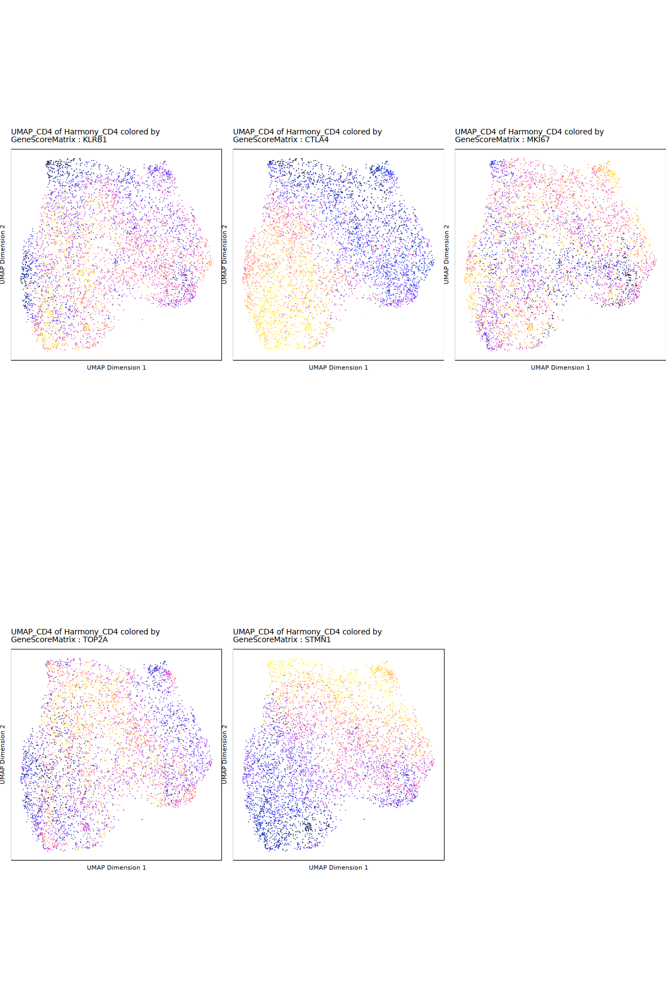

In [23]:
# 基因得分UMAP可视化
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP_CD4",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(proj)
)
options(repr.plot.height = 15, repr.plot.width = 10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

In [58]:
cell_annotations <- list(
    "Tn/Tcm" = paste0("C", c(7:9, 11:14)),
    "Treg" = paste0("C", c( 2, 3, 5, 10, 15:17)),
    "Th" = paste0("C", c(1, 4, 6))
)

In [59]:
## 根据cell——annotations和proj$Clusters创建proj$cellType列
# 对于cell_annotations中的每一个元素（细胞类型）返回proj$Clusters中对应的索引
idz <- lapply(cell_annotations, function(x) which(proj$clusters_CD4 %in% x))
# 创建proj$cellType列，长度为proj@cellColData的行数，初始化为NA
proj$CD4Type <- rep(NA, nrow(proj@cellColData))
# 遍历idz中的每一个元素，将proj$cellType中对应的索引赋值为元素的名称
for(i in names(idz)){proj$CD4Type[idz[[i]]] <- i}

In [60]:
table(proj$CD4Type)


    Th Tn/Tcm   Treg 
  1177   2277   2047 

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca4141778a-Date-2025-04-21_Time-11-07-07.415492.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca4141778a-Date-2025-04-21_Time-11-07-07.415492.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-375eca2f7a1fd0-Date-2025-04-21_Time-11-07-08.355128.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-375eca2f7a1fd0-Date-2025-04-21_Time-11-07-08.355128.log



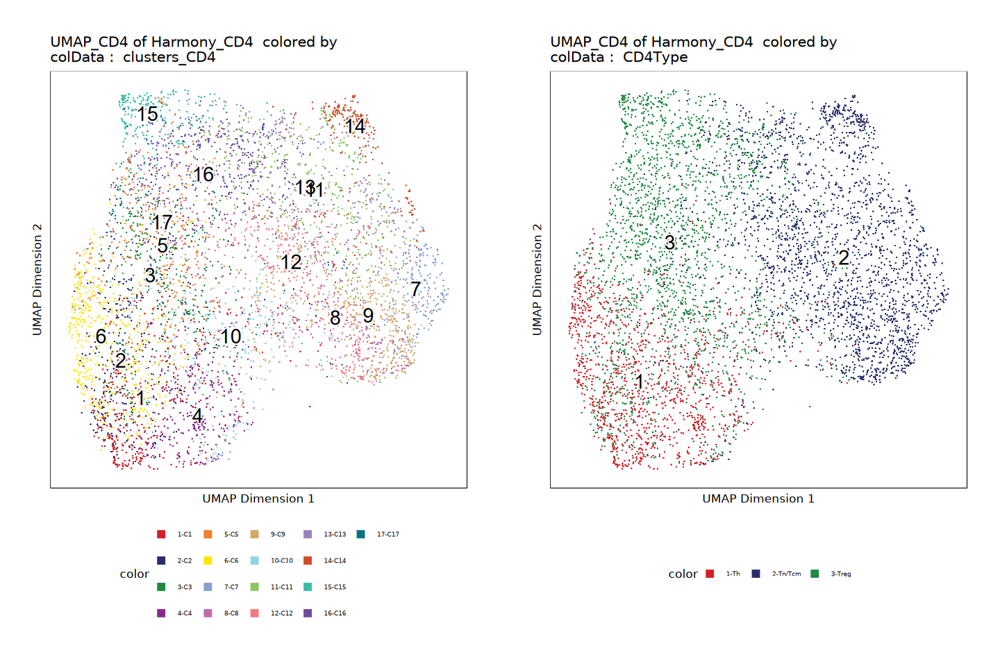

In [61]:
options(repr.plot.height = 8, repr.plot.width = 12)
p1 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "clusters_CD4", 
    embedding = "UMAP_CD4",
    labelSize = 6
    )
p2 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
    name = "CD4Type", 
    embedding = "UMAP_CD4",
    labelSize = 6
    )
ggAlignPlots(p1, p2, type = "h")

In [62]:
## marker gene analysis
markersGS <- getMarkerFeatures(
    ArchRProj = proj,
    useMatrix = "GeneScoreMatrix",
    groupBy = "clusters_CD4",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
    )

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-375eca1ab8709c-Date-2025-04-21_Time-11-07-13.934175.log
If there is an issue, please report to github with logFile!



MatrixClass = Sparse.Double.Matrix

2025-04-21 11:07:14.419331 : Matching Known Biases, 0.005 mins elapsed.

###########
2025-04-21 11:10:33.878182 : Completed Pairwise Tests, 3.33 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-375eca1ab8709c-Date-2025-04-21_Time-11-07-13.934175.log



In [63]:
saveRDS(markersGS, file = "./ArchRProject_CD4/markersGS_CD4Cluster.rds")

In [30]:
markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.05 & Log2FC >= 1.25")
markerList <- lapply(markerList, as.data.frame)
library(writexl)
## 按照MeanDiff排序
for(i in 1:length(markerList)){
    markerList[[i]] <- markerList[[i]][order(-markerList[[i]]$MeanDiff), ]
}
## 保存为Excel文件
WriteXLS::WriteXLS(markerList,
                   ExcelFileName = "./ArchRProject_CD4/markersGS_CD4Cluster.xlsx",
                   SheetNames = names(markerList))

In [31]:
markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.05 & Log2FC >= 1.25")
## Clusters差异基因，按照FDR排序，并保存为Excel文件
markerList <- lapply(markerList, as.data.frame)
for(i in 1:length(markerList)){
    markerList[[i]] <- markerList[[i]][order(markerList[[i]]$FDR), ]
}
WriteXLS::WriteXLS(markerList,
                   ExcelFileName = "./ArchRProject_CD4/markersGS_FDR_CD4Cluster.xlsx",
                   SheetNames = names(markerList))

In [32]:
## majorType 差异peaks
markerPK <- getMarkerFeatures(
    ArchRProj = proj,
    useMatrix = "PeakMatrix", 
    groupBy = "clusters_CD4",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-375eca10f522ed-Date-2025-04-21_Time-09-39-46.570377.log
If there is an issue, please report to github with logFile!



MatrixClass = Sparse.Integer.Matrix

2025-04-21 09:39:47.616533 : Matching Known Biases, 0.016 mins elapsed.

###########
2025-04-21 09:42:30.207802 : Completed Pairwise Tests, 2.725 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-375eca10f522ed-Date-2025-04-21_Time-09-39-46.570377.log



In [65]:
## majorType 差异peaks
markerPK <- getMarkerFeatures(
    ArchRProj = proj,
    useMatrix = "PeakMatrix", 
    groupBy = "neoadjuvant",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-375eca71fce8a-Date-2025-04-21_Time-11-13-45.78608.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2025-04-21 11:13:46.561446 : Matching Known Biases, 0.01 mins elapsed.

###########
2025-04-21 11:16:17.399508 : Completed Pairwise Tests, 2.524 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-375eca71fce8a-Date-2025-04-21_Time-11-13-45.78608.log



In [33]:
saveRDS(markerPK, file = "./ArchRProject_CD4/markersPK_CD4Cluster.rds")

In [66]:
saveRDS(markerPK, file = "./ArchRProject_CD4/markersPK_CD4neoadjuvant.rds")

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-375eca6d2c0bb2-Date-2025-04-21_Time-11-12-15.003768.log
If there is an issue, please report to github with logFile!

Printing Top Marker Genes:

C1:

	MIR3605, ATP1A4, OR5B3, LOC101928865, ZC3H12C, PATE2, TAS2R20, KRT7, OR6C74, PMCH, HCAR3, LINC00428, LINC01055, SPERT, PSMB5

C2:

	LINC01777, LOC102724450, MIR34A, IGSF21, LINC01648, RPE65, MIR7852, HSD3B1, MIR921, MRC1, LINC01515, COL13A1, UNC5B, UNC5B-AS1, EMX2OS

C3:

	NCAM1, SERPINA2, LINC01878, CCR8, LOC101929172, LINC02209, C11orf88, NCAM1-AS1, MIR4776-1, GTSF1L, LINC01777, LOC102724450, MIR34A, MIR6729, IGSF21

C4:

	MIR6729, PLA2G2A, PLA2G2D, PPIEL, CYP4B1, FYB2, NFIA-AS1, DIRAS3, SLC44A5, COL24A1, KIAA1107, LINC01750, VANGL1, LOC101928009, CD1E

C5:

	CSF3R, FCRL3, LINC00210, LINC01517, LINC00837, LINC01561, FOXI2, OR9I1, ANKK1, KIRREL3-AS2, METTL7A, LINC00609, CKMT1A, STRA6, MIR548W

C6:

	TTC39A-AS1, C8B, DEPDC1, IVL, OR6F1, OR1C1, OR14A16, OR11L1, MRLN, MIR4295, OR51V1, LI

 [1] "CCR7"     "IL7R"     "TCF7"     "SELL"     "LEF1"     "KLF2"    
 [7] "ITGAE"    "ZNF683"   "CD69"     "FOXP3"    "TNFRSF18" "TNFRSF9" 
[13] "TNFRSF4"  "CTLA4"    "TIGIT"    "IFNG"     "CXCL13"   "GATA3"   
[19] "RORC"     "BCL6"     "MKI67"    "KLRB1"   


Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-375eca6d2c0bb2-Date-2025-04-21_Time-11-12-15.003768.log



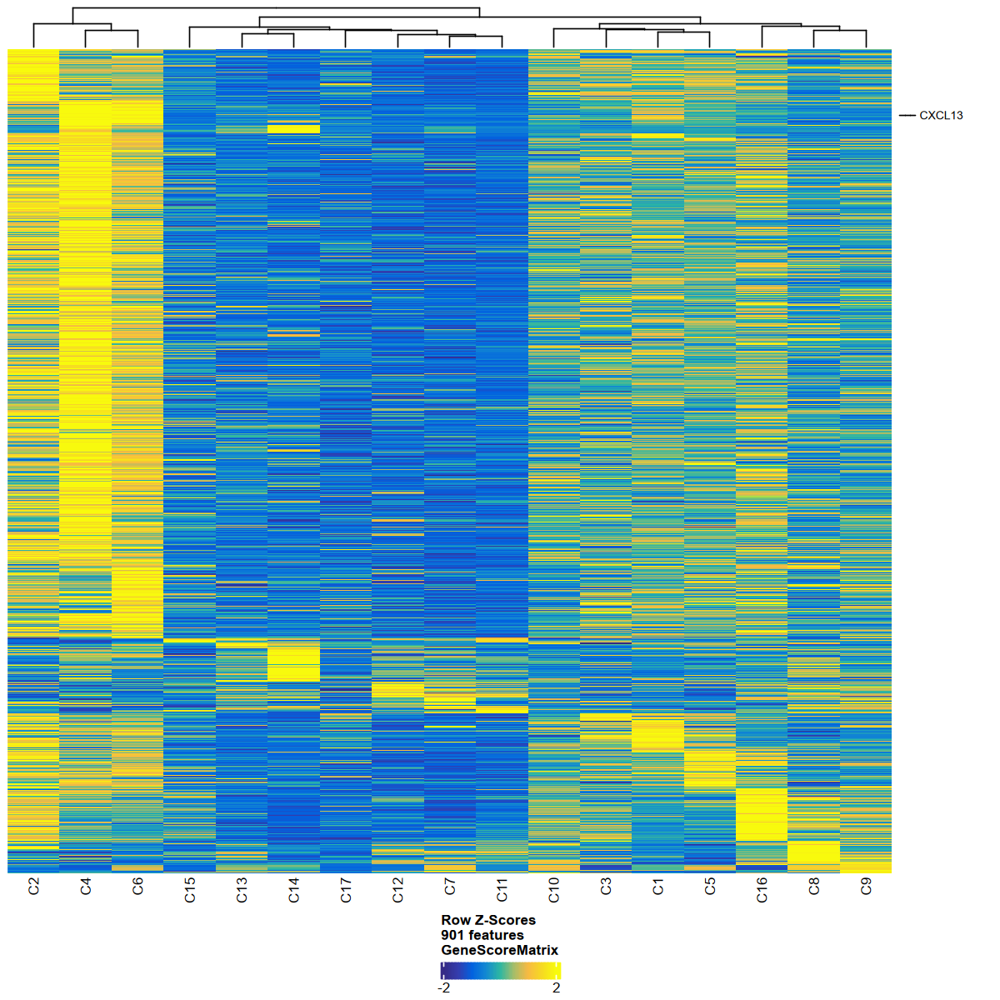

In [64]:
markerGenes <- c(
    "CCR7", "IL7R", "TCF7", "SELL", "LEF1", "KLF2",  # 幼稚T细胞（Tn)&中心记忆T细胞（Tcm)
    "ITGAE", "ZNF683", "CD69", # 组织驻留T细胞
    "FOXP3", "TNFRSF18","TNFRSF9", "TNFRSF4", #调节性T细胞（Treg）
    "CTLA4", "TIGIT", # 细胞毒性T细胞（Tctl）
    "IFNG", "CXCL13", "GATA3", "RORC", "BCL6", # 辅助性T细胞
    "MKI67", "KLRB1"
    
)

heatmapGS <- plotMarkerHeatmap(
  seMarker = markersGS, 
  cutOff = "FDR <= 0.05 & Log2FC >= 1.25", 
  labelMarkers = markerGenes
)

options(repr.plot.height = 10, repr.plot.width = 10)
ComplexHeatmap::draw(heatmapGS, 
                     heatmap_legend_side = "bot", 
                     annotation_legend_side = "bot")

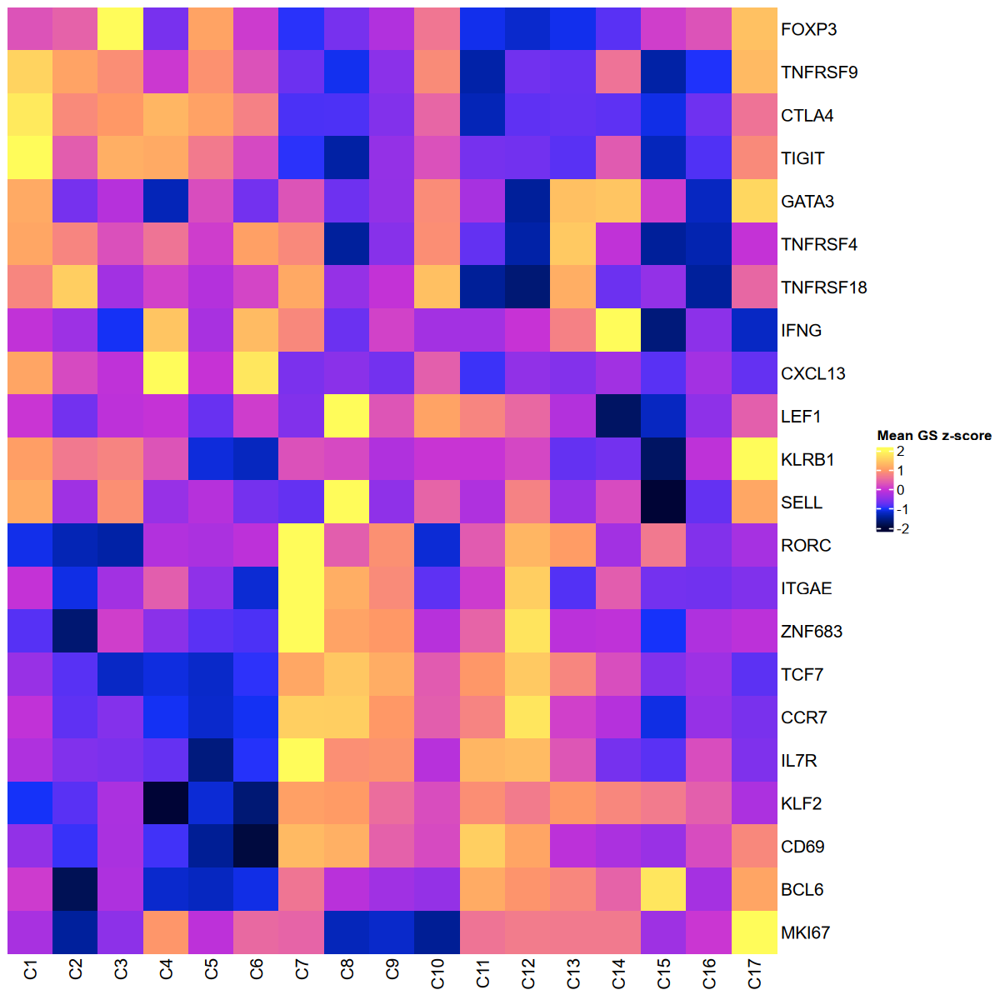

In [35]:
## 后续图 - 基于clusters
### marker gene基因活性
# Heatmap
## marker genes, 根据05_01_annotation中的显著表达来确定绘图的marker genes
markerGenes <- c(
    "CCR7", "IL7R", "TCF7", "SELL", "LEF1", "KLF2",  # 幼稚T细胞（Tn)&中心记忆T细胞（Tcm)
    "ITGAE", "ZNF683", "CD69", # 组织驻留T细胞
    "FOXP3", "TNFRSF18","TNFRSF9", "TNFRSF4", #调节性T细胞（Treg）
    "CTLA4", "TIGIT", # 细胞毒性T细胞（Tctl）
    "IFNG", "CXCL13", "GATA3", "RORC", "BCL6", # 辅助性T细胞
    "MKI67", "KLRB1"
    
)

## 绘制只有marker基因的热图，Mean GS z-score

### 提取差异基因中在marker genes中的基因
idx <- which(mcols(markersGS)$name %in% markerGenes)
### 提取指定行，为矩阵
mtx <- assays(markersGS[idx,])$Mean %>% `rownames<-`(., mcols(markersGS)$name[idx])
### 标准化（z-score），并转置
mtx <- t(scale(t(mtx)))
### 定义层次聚类函数
fh <- function(x) hclust(dist(x), method="ward.D2")
### 定义颜色函数
col_fun1 <- colorRamp2(c(-2,-1,0,1,2), paletteContinuous(set = "horizonExtra", n = 5))
options(repr.plot.width = 10, repr.plot.height = 10)
ht1 <- Heatmap(mtx, name = "Mean GS z-score", cluster_rows = fh, cluster_columns = F, show_row_dend = F, col = col_fun1)
p3 <- draw(ht1)
p3

In [36]:
mtx

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,C15,C16,C17
TNFRSF18,0.79351102,1.5213212,-0.34592907,0.11644514,-0.18736245,0.14617270,1.1539881,-0.4465382,-0.03845946,1.38106202,-1.470232242,-1.656540507,1.2054413,-0.71994695,-0.46535920,-1.45425449,0.46668114
TNFRSF4,1.12640822,0.7794936,0.24357306,0.59388296,0.08121863,1.07131792,0.8281155,-1.4512490,-0.55333136,0.87964393,-0.770788584,-1.395589238,1.4767337,-0.06445148,-1.45885492,-1.35252938,-0.03359361
TNFRSF9,1.57890235,1.0964996,0.87457015,0.04412410,0.91554615,0.26444550,-0.7202182,-1.0548770,-0.52043745,0.84577233,-1.392349591,-0.692545463,-0.7511793,0.58354583,-1.40281983,-0.98912609,1.32014683
ZNF683,-0.83258869,-1.6704792,0.09166410,-0.53202241,-0.81345227,-0.87239010,2.0637188,1.0913554,0.98926689,-0.15284514,0.437214252,1.750329629,-0.1220636,-0.08226500,-1.00394062,-0.23152784,-0.10997413
RORC,-1.07907479,-1.3302490,-1.39887281,-0.20588344,-0.26474807,-0.09567404,2.2031636,0.3750507,0.90094240,-1.17765804,0.350292855,1.281583436,1.0269375,-0.34175657,0.64816915,-0.58695668,-0.30526628
SELL,1.17403041,-0.3669439,0.89014030,-0.43472948,-0.16895703,-0.66996090,-0.7629474,2.0157350,-0.49485526,0.43566480,-0.225648345,0.744489549,-0.4075020,0.20229264,-2.29675320,-0.76415866,1.13010337
GATA3,1.16818699,-0.6602940,-0.16866762,-1.31568501,0.21953317,-0.68007980,0.2818159,-0.7126100,-0.45906441,0.85235432,-0.298539784,-1.460017049,1.3818355,1.43059082,0.07793884,-1.27139953,1.61410166
MKI67,-0.29334628,-1.4526169,-0.50492948,0.96546832,-0.09482998,0.48504710,0.4339880,-1.3027585,-1.22797944,-1.48490551,0.599827012,0.681911305,0.6579442,0.66186696,-0.37673130,0.03044701,2.22159746
KLRB1,1.04961247,0.6484108,0.76922056,0.28302223,-1.14667998,-1.28121882,0.2568993,0.1832859,-0.22205287,0.01495761,0.003491506,0.162757932,-0.7636900,-0.67894588,-1.75072107,-0.08899793,2.56064820
CD69,-0.47368699,-0.9353121,-0.27480433,-0.90876993,-1.48556416,-1.94707670,1.3274935,1.2205748,0.40652414,0.19415568,1.533707309,1.110508067,-0.1116722,-0.26437632,-0.41376589,0.20684476,0.81522034


In [91]:
## marker gene analysis
markersGS <- getMarkerFeatures(
    ArchRProj = proj,
    useMatrix = "GeneScoreMatrix",
    groupBy = "neoadjuvant",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
    )

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-375eca16600056-Date-2025-04-22_Time-08-51-10.055645.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2025-04-22 08:51:10.487133 : Matching Known Biases, 0.006 mins elapsed.

###########
2025-04-22 08:53:17.525676 : Completed Pairwise Tests, 2.123 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-375eca16600056-Date-2025-04-22_Time-08-51-10.055645.log



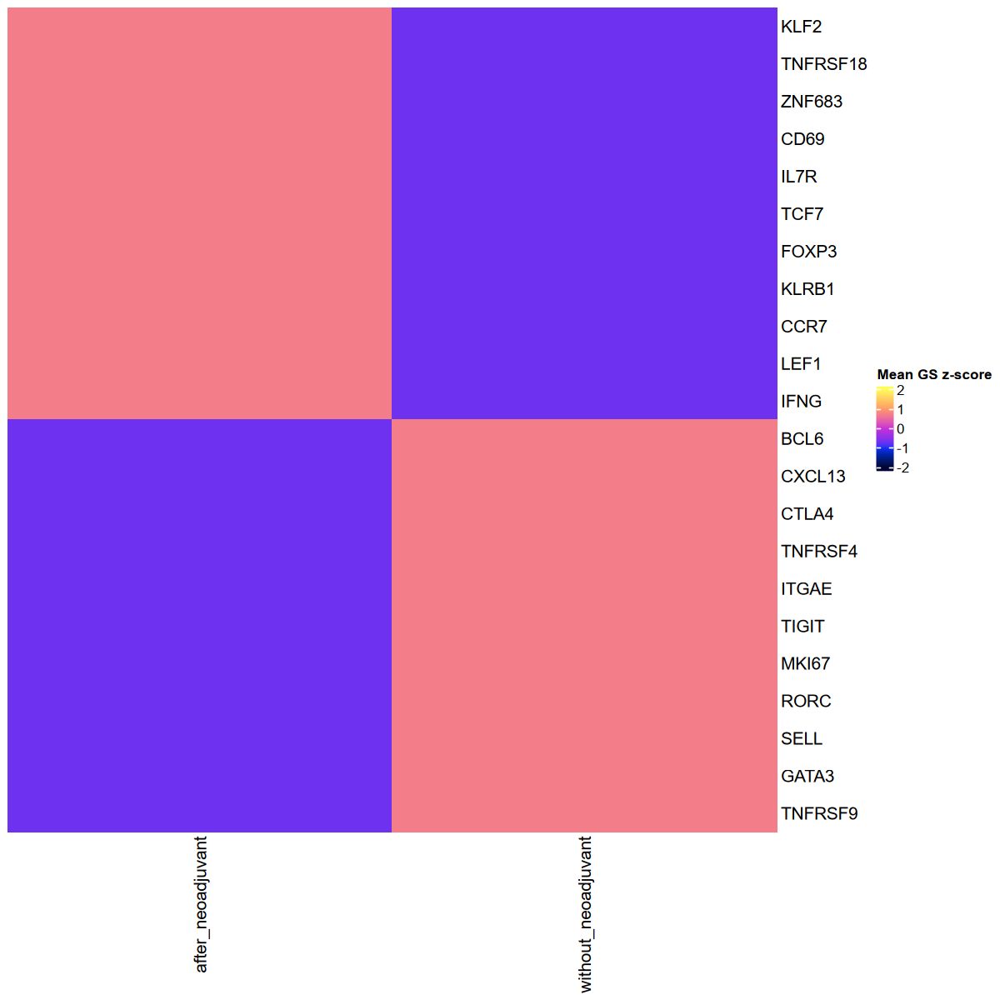

In [92]:
markerGenes <- c(
    "CCR7", "IL7R", "TCF7", "SELL", "LEF1", "KLF2",  # 幼稚T细胞（Tn)&中心记忆T细胞（Tcm)
    "ITGAE", "ZNF683", "CD69", # 组织驻留T细胞
    "FOXP3", "TNFRSF18","TNFRSF9", "TNFRSF4", #调节性T细胞（Treg）
    "CTLA4", "TIGIT", # 细胞毒性T细胞（Tctl）
    "IFNG", "CXCL13", "GATA3", "RORC", "BCL6", # 辅助性T细胞
    "MKI67", "KLRB1"
    
)

## 绘制只有marker基因的热图，Mean GS z-score

### 提取差异基因中在marker genes中的基因
idx <- which(mcols(markersGS)$name %in% markerGenes)
### 提取指定行，为矩阵
mtx <- assays(markersGS[idx,])$Mean %>% `rownames<-`(., mcols(markersGS)$name[idx])
### 标准化（z-score），并转置
mtx <- t(scale(t(mtx)))
### 定义层次聚类函数
fh <- function(x) hclust(dist(x), method="ward.D2")
### 定义颜色函数
col_fun1 <- colorRamp2(c(-2,-1,0,1,2), paletteContinuous(set = "horizonExtra", n = 5))
options(repr.plot.width = 10, repr.plot.height = 10)
ht1 <- Heatmap(mtx, name = "Mean GS z-score", cluster_rows = fh, cluster_columns = F, show_row_dend = F, col = col_fun1)
p3 <- draw(ht1)
p3

DataFrame with 6 rows and 6 columns
    seqnames       idx              name combinedVars combinedMeans      rank
       <Rle> <integer>       <character>    <numeric>     <numeric> <integer>
f87        z        87 FOXA1.Forkhead_87      68.3331   -0.65523535         1
f86        z        86     Fosl2.bZIP_86      64.1998    0.00507140         2
f1         z         1       AP.1.bZIP_1      63.3041    0.02254696         3
f99        z        99      Fra2.bZIP_99      62.8903    0.00733377         4
f94        z        94 FOXM1.Forkhead_94      62.5174   -0.64134957         5
f88        z        88 FOXA1.Forkhead_88      61.6128   -0.63294138         6


ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-375eca153c8fa5-Date-2025-04-21_Time-11-20-29.222663.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Assays.Matrix

2025-04-21 11:20:29.482573 : Matching Known Biases, 0.002 mins elapsed.

###########
2025-04-21 11:20:37.091088 : Completed Pairwise Tests, 0.129 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-375eca153c8fa5-Date-2025-04-21_Time-11-20-29.222663.log

Warning message:
“The input is a data frame-like object, convert it to a matrix.”


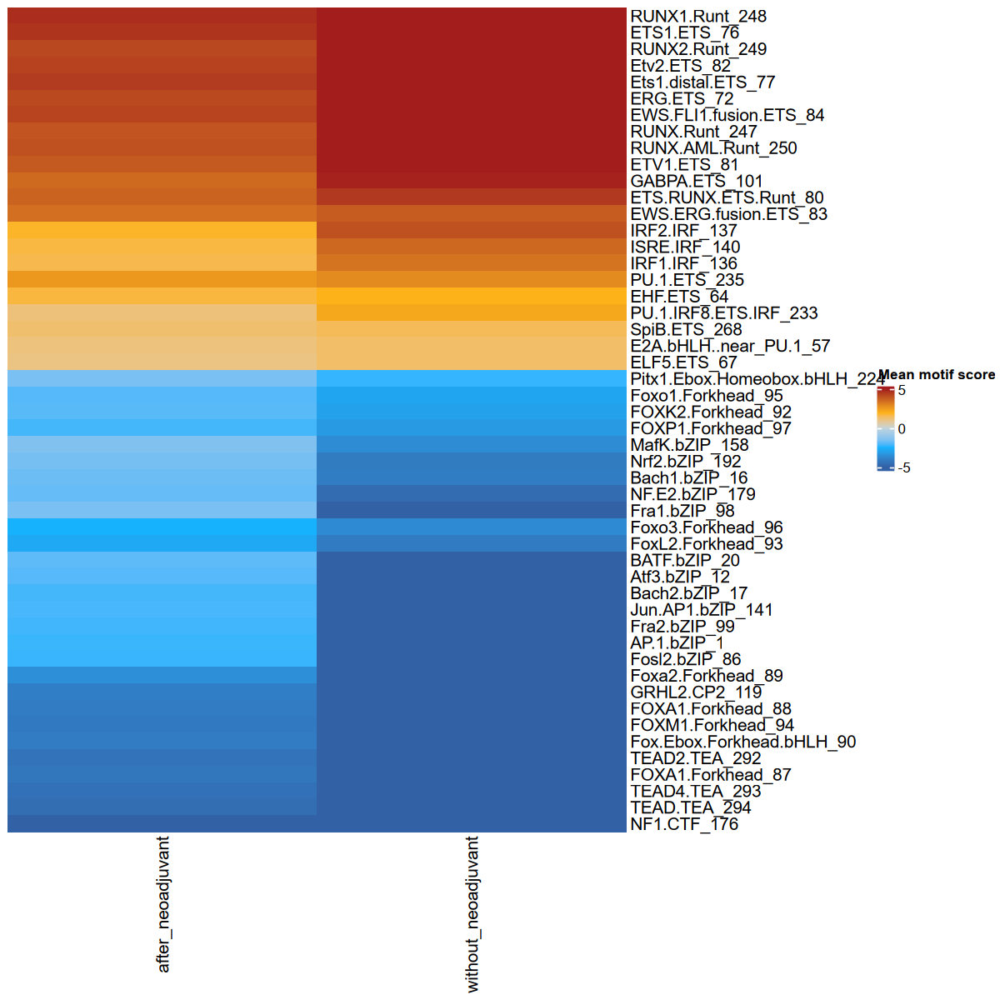

In [70]:
### motif enrichment
VarMotifs <- getVarDeviations(proj, name = "homerMatrix", plot = F)
MotifScoreClusters <- getMarkerFeatures(proj, 
                                        useMatrix = "homerMatrix", 
                                        groupBy = "neoadjuvant",
                                        bias = c("TSSEnrichment", "log10(nFrags)"),
                                        testMethod = "wilcoxon", 
                                        useSeqnames = "z")

fh <- function(x) hclust(dist(x), method="ward.D2")
idy <- which(mcols(MotifScoreClusters)$name %in% VarMotifs$name[c(1:50)])
mtx2 <- assays(MotifScoreClusters[idy,])$Mean %>% `rownames<-`(., mcols(MotifScoreClusters)$name[idy])

col_fun2 <- colorRamp2(c(-5,-2.5,0,2,5), paletteContinuous(set = "solarExtra", n = 5))
ht2 <- Heatmap(mtx2, name = "Mean motif score", cluster_rows = fh, cluster_columns = F, show_row_dend = F, col = col_fun2)
options(repr.plot.width=10, repr.plot.height=10)
p6 <- draw(ht2)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-375eca443b9dd-Date-2025-04-21_Time-09-43-28.933442.log
If there is an issue, please report to github with logFile!



Identified 4793 markers!



  [1] "chr1:2583163-2583663"      "chr1:6965386-6965886"     
  [3] "chr1:6996315-6996815"      "chr1:7478867-7479367"     
  [5] "chr1:7549203-7549703"      "chr1:8540479-8540979"     
  [7] "chr1:8560983-8561483"      "chr1:8603969-8604469"     
  [9] "chr1:8679240-8679740"      "chr1:10251648-10252148"   
 [11] "chr1:12127411-12127911"    "chr1:15290348-15290848"   
 [13] "chr1:16326706-16327206"    "chr1:23624331-23624831"   
 [15] "chr1:24189472-24189972"    "chr16:26597972-26598472"  
 [17] "chr20:43736660-43737160"   "chr10:110774128-110774628"
 [19] "chr13:33679236-33679736"   "chr22:39100101-39100601"  
 [21] "chr5:157350993-157351493"  "chr5:66840618-66841118"   
 [23] "chr1:1079331-1079831"      "chr1:1629679-1630179"     
 [25] "chr1:2148620-2149120"      "chr1:2581647-2582147"     
 [27] "chr1:2840339-2840839"      "chr1:3656635-3657135"     
 [29] "chr1:3676942-3677442"      "chr1:6963115-6963615"     
 [31] "chr1:3922171-3922671"      "chr1:6025169-6025669"     
 [33] "c

Adding Annotations..

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-375eca443b9dd-Date-2025-04-21_Time-09-43-28.933442.log



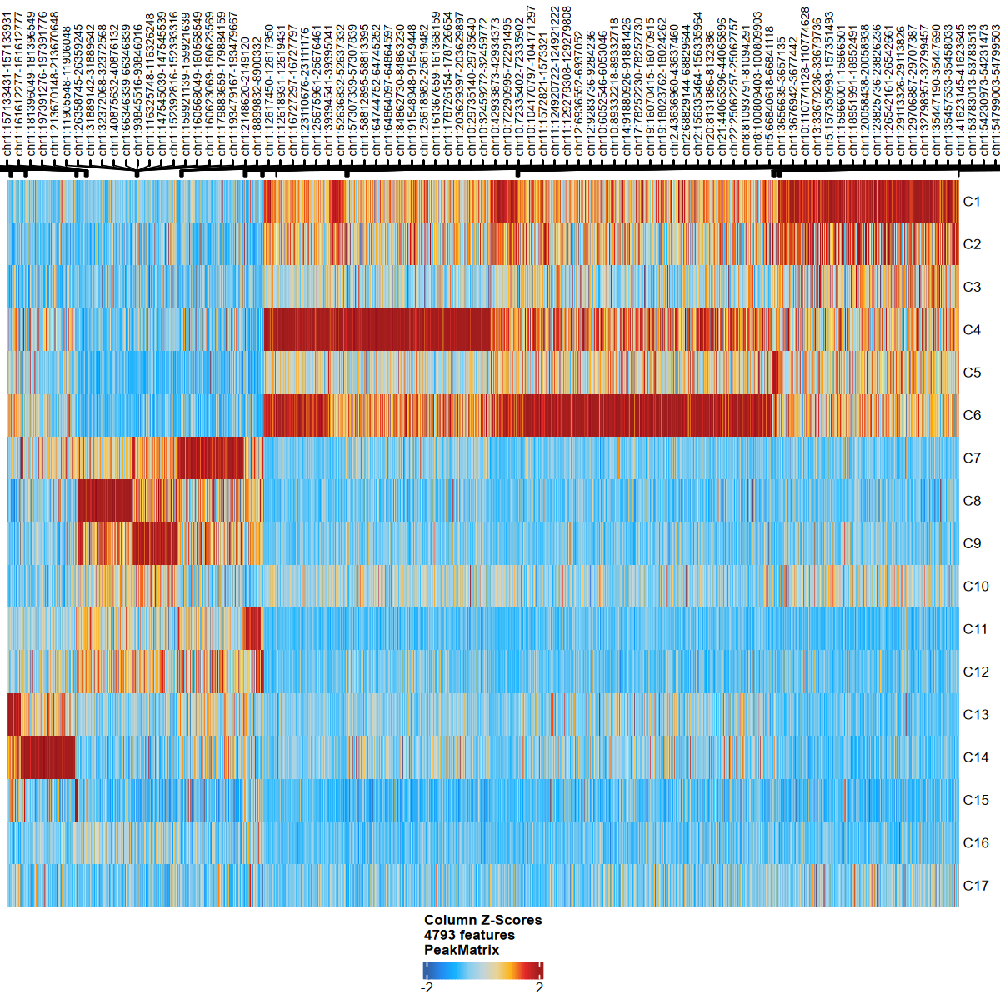

In [38]:
heatmapPeaks <- plotMarkerHeatmap(
    seMarker = markerPK,
    cutOff = "FDR <= 0.05 & Log2FC >= 1.25",
    transpose = TRUE
)
options(repr.plot.height = 10, repr.plot.width = 10)
ComplexHeatmap::draw(heatmapPeaks, 
                     heatmap_legend_side = "bot", 
                     annotation_legend_side = "bot")

In [68]:
new_order <- c(
     "Tn/Tcm", "Treg", "Th"
)

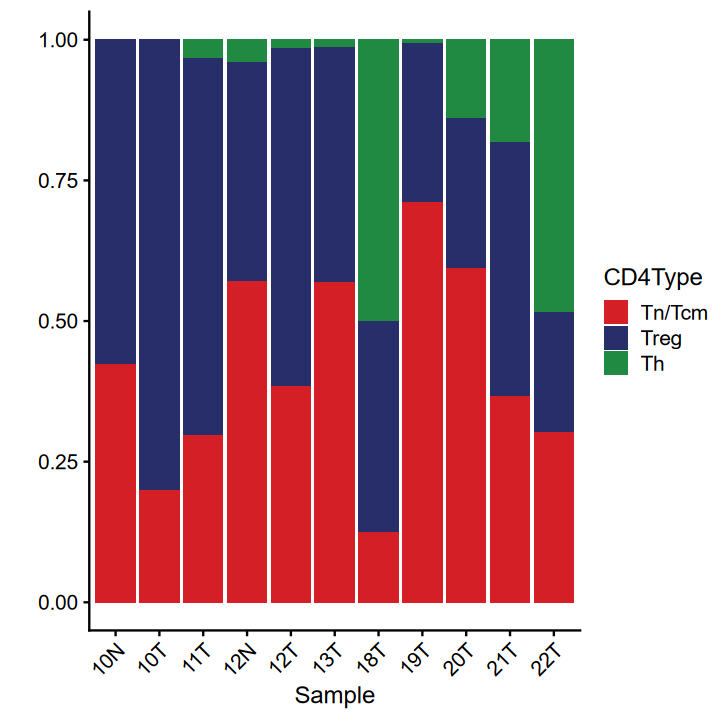

In [69]:
# 计算各样本中细胞类型的比例
sample_cell_type_distribution <- table(proj$Sample, proj$CD4Type)
sample_cell_type_distribution <- prop.table(sample_cell_type_distribution, 1)

# 转换为数据框
df_sample <- as.data.frame(sample_cell_type_distribution)
df_sample$Var2 <- factor(df_sample$Var2, levels = new_order)
cols <- ArchR::paletteDiscrete(df_sample$Var2)

# 创建堆叠图
p <- ggplot(df_sample, aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat="identity", position = position_stack(reverse = TRUE)) +
  scale_fill_manual(values = cols) +
  theme_cowplot() +
  xlab("Sample") +
  ylab("") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  labs(fill = "CD4Type")

options(repr.plot.width = 6, repr.plot.height = 6)
# ggsave("/data/hanxue/BCY_ATAC/joint_output/Sample-CellType-Distribution.svg",plot = p, width = 6, height = 6, device = "svg")
p

In [89]:
# 检查选定基因的位点可及性
gene_list <- c("IL2RG", "CXCL10", "CXCL11", "FOXP3", "CCL2")

p <- plotBrowserTrack(
    ArchRProj = proj,
    groupBy = "neoadjuvant",
    geneSymbol = gene_list, 
    upstream = 50000,
    downstream = 50000
)

plotPDF(p, name = "CD4_neoadjuvant_track",ArchRProj = proj, addDOC = FALSE)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-375eca267c0d19-Date-2025-04-21_Time-11-42-25.657365.log
If there is an issue, please report to github with logFile!

2025-04-21 11:42:25.739672 : Validating Region, 0.001 mins elapsed.



GRanges object with 5 ranges and 2 metadata columns:
      seqnames            ranges strand |     gene_id      symbol
         <Rle>         <IRanges>  <Rle> | <character> <character>
  [1]     chrX 71107404-71112108      - |        3561       IL2RG
  [2]     chr4 76021117-76023497      - |        3627      CXCL10
  [3]     chr4 76033682-76041415      - |        6373      CXCL11
  [4]     chrX 49250436-49264826      - |       50943       FOXP3
  [5]    chr17 34255285-34257203      + |        6347        CCL2
  -------
  seqinfo: 24 sequences from hg38 genome


2025-04-21 11:42:25.807076 : Adding Bulk Tracks (1 of 5), 0.003 mins elapsed.

2025-04-21 11:42:27.202306 : Adding Feature Tracks (1 of 5), 0.026 mins elapsed.

2025-04-21 11:42:27.372605 : Adding Gene Tracks (1 of 5), 0.029 mins elapsed.

2025-04-21 11:42:27.903761 : Plotting, 0.037 mins elapsed.

2025-04-21 11:42:28.843258 : Adding Bulk Tracks (2 of 5), 0.053 mins elapsed.

2025-04-21 11:42:30.980006 : Adding Feature Tracks (2 of 5), 0.089 mins elapsed.

2025-04-21 11:42:31.080939 : Adding Gene Tracks (2 of 5), 0.09 mins elapsed.

2025-04-21 11:42:31.493063 : Plotting, 0.097 mins elapsed.

2025-04-21 11:42:32.196015 : Adding Bulk Tracks (3 of 5), 0.109 mins elapsed.

2025-04-21 11:42:34.726912 : Adding Feature Tracks (3 of 5), 0.151 mins elapsed.

2025-04-21 11:42:34.858522 : Adding Gene Tracks (3 of 5), 0.153 mins elapsed.

2025-04-21 11:42:35.327419 : Plotting, 0.161 mins elapsed.

2025-04-21 11:42:36.219795 : Adding Bulk Tracks (4 of 5), 0.176 mins elapsed.

2025-04-21 11:42:38.48

NULL
_msg_send errno: 4 strerror: Interrupted system call


Plotting Gtable!

Plotting Gtable!

Plotting Gtable!

Plotting Gtable!



In [72]:
# 差异，motif分析
neoMotif <- getMarkerFeatures(
    ArchRProj = proj,
    useMatrix = "MotifMatrix",
    groupBy = "neoadjuvant",
    useGroups = "without_neoadjuvant", # 前景组
    bgdGroups = "after_neoadjuvant", # 背景组
    testMethod = "wilcoxon",
    bias = c("TSSEnrichment", "log10(nFrags)")
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-375eca401f0bf5-Date-2025-04-21_Time-11-24-26.599416.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Assays.Matrix

When accessing features from a matrix of class Sparse.Assays.Matrix it requires 1 seqname!
Continuing with first seqname 'deviations'!
If confused, try getSeqnames(ArchRProj, 'MotifMatrix'') to list out available seqnames for input!

2025-04-21 11:24:27.133006 : 

2025-04-21 11:24:27.141801 : Matching Known Biases, 0.006 mins elapsed.

2025-04-21 11:24:27.942829 : Computing Pairwise Tests (1 of 1), 0.019 mins elapsed.

Pairwise Test without_neoadjuvant : Seqnames deviations

###########
2025-04-21 11:24:45.23508 : Completed Pairwise Tests, 0.307 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-375eca401f0bf5-Date-2025-04-21_Time-11-24-26.599416.log



In [73]:
neoMotifResult <- getMarkers(neoMotif, cutOff = "FDR <= 0.05")[[1]]
neoMotifResult <- as.data.frame(neoMotifResult)

In [74]:
top5_positive <- neoMotifResult %>% 
  arrange(desc(MeanDiff)) %>% 
  dplyr::slice(1:20)
top5_positive$name

[1] "IRF9_636"            "IRF8_633"            "ENSG00000250542_156"
 [4] "IRF2_634"            "IRF5_631"            "IRF6_628"           
 [7] "CEBPE_107"           "AC0021266_638"       "MEF2B_643"          
[10] "HOXD8_537"           "EOMES_788"           "TBR1_786"           
[13] "IRF3_630"            "HSF4_624"            "CEBPG_128"          
[16] "HSF1_627"            "HSF2_623"            "NFKB2_714"          
[19] "CTCF_177"            "MEF2D_642"

In [75]:
top5_negative <- neoMotifResult %>% 
  arrange(MeanDiff) %>% 
  dplyr::slice(1:20)
top5_negative$name

[1] "JUNB_139"    "FOSL2_105"   "JUN_143"     "FOS_137"     "SMARCC1_651"
 [6] "FOSL1_142"   "JUND_124"    "FOSB_121"    "BACH2_113"   "BACH1_130"  
[11] "JDP2_125"    "TCF7L2_762"  "NFE2_119"    "TCF7_750"    "LEF1_760"   
[16] "NFE2L2_115"  "TCF7L1_763"  "NRF1_805"    "SIX4_407"    "NR4A2_686"

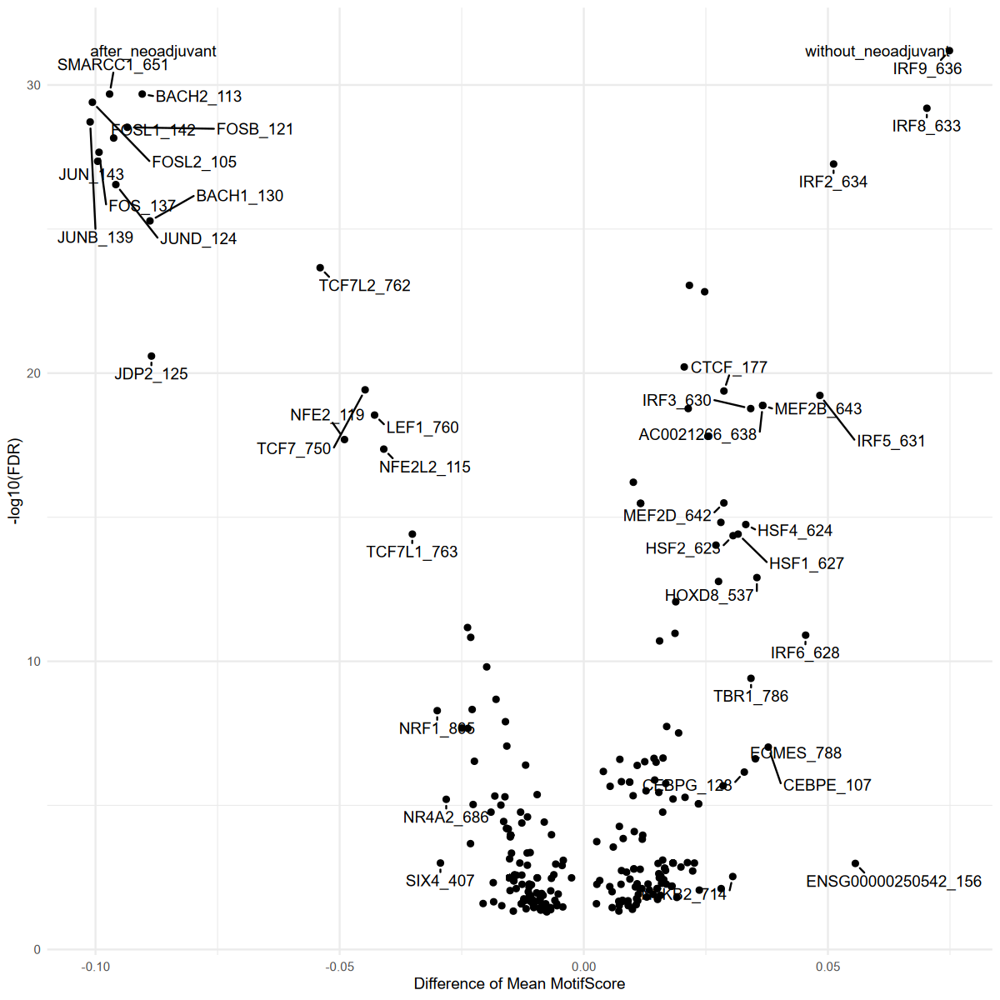

In [76]:
# MeanDiff > 0 表示 without_neoadjuvant 组的得分高于 after_neoadjuvant 组（图中靠右）。
# MeanDiff < 0 表示 after_neoadjuvant 组的得分高于 without_neoadjuvant 组（图中靠左）。
# 基本火山图
p <- ggplot(neoMotifResult, aes(x = MeanDiff, y = -log10(FDR))) +
  geom_point() +
  labs(x = "Difference of Mean MotifScore",
       y = "-log10(FDR)") +
  theme_minimal()

# 找出 MeanDiff 最大的五个点（正值，右侧）
top5_positive <- neoMotifResult %>% 
  arrange(desc(MeanDiff)) %>% 
  dplyr::slice(1:20)

# 找出 MeanDiff 最小的五个点（负值，左侧）
top5_negative <- neoMotifResult %>% 
  arrange(MeanDiff) %>% 
  dplyr::slice(1:20)

# 合并为包含十个点的 top10 数据框
top10 <- bind_rows(top5_positive, top5_negative)

# 为 top10 中的点添加标签
p <- p + geom_text_repel(
      data = top10, aes(label = name), 
      vjust = -1,
      force = 4, # 增大注释与点之间的距离
      box.padding = 0.5, # 注释框与点的最小间距
      point.padding = 0.5, # 点与连接线的间距
      min.segment.length = 0, # 强制显示所有连线 
      max.overlaps = 3000

  )

# 添加组别注释
p <- p +
  annotate("text", x = min(neoMotifResult$MeanDiff), y = max(-log10(neoMotifResult$FDR)),
           label = "after_neoadjuvant", hjust = 0) +
  annotate("text", x = max(neoMotifResult$MeanDiff), y = max(-log10(neoMotifResult$FDR)),
           label = "without_neoadjuvant", hjust = 1)

# 显示图形
print(p)

In [77]:
seGroupMotif <- getGroupSE(ArchRProj = proj, useMatrix = "MotifMatrix", groupBy = "neoadjuvant")
seGroupMotif

ArchR logging to : ArchRLogs/ArchR-getGroupSE-375eca34e20f43-Date-2025-04-21_Time-11-26-23.611079.log
If there is an issue, please report to github with logFile!

Getting Group Matrix

2025-04-21 11:26:43.452312 : Successfully Created Group Matrix, 0.315 mins elapsed.

Normalizing by number of Cells

ArchR logging successful to : ArchRLogs/ArchR-getGroupSE-375eca34e20f43-Date-2025-04-21_Time-11-26-23.611079.log



class: SummarizedExperiment 
dim: 1740 2 
metadata(0):
assays(1): MotifMatrix
rownames(1740): f1 f2 ... f1739 f1740
rowData names(3): seqnames idx name
colnames(2): after_neoadjuvant without_neoadjuvant
colData names(17): TSSEnrichment ReadsInTSS ... FRIP nCells

In [78]:
seZ <- seGroupMotif[rowData(seGroupMotif)$seqnames=="z",]

In [79]:
rowData(seZ)$maxDelta <- lapply(seq_len(ncol(seZ)), function(x){
  rowMaxs(assay(seZ) - assay(seZ)[,x])
}) %>% Reduce("cbind", .) %>% rowMaxs

In [80]:
corGSM_MM <- correlateMatrices(
    ArchRProj = proj,
    useMatrix1 = "GeneScoreMatrix",
    useMatrix2 = "MotifMatrix",
    reducedDims = "Harmony_CD4"
)
corGSM_MM

ArchR logging to : ArchRLogs/ArchR-correlateMatrices-375eca7edd1090-Date-2025-04-21_Time-11-27-05.454427.log
If there is an issue, please report to github with logFile!

When accessing features from a matrix of class Sparse.Assays.Matrix it requires 1 seqname!
Continuing with first seqname 'z'!
If confused, try getFeatures(ArchRProj, 'MotifMatrix') to list out available seqnames for input!

2025-04-21 11:27:10.079679 : Testing 869 Mappings!, 0.077 mins elapsed.

Warning! Not all requested dimsToUse are available! The follow dims were not found in Harmony_CD4:
30
Unavailable dims will be automatically excluded...

2025-04-21 11:27:10.093027 : Computing KNN, 0.077 mins elapsed.

2025-04-21 11:27:10.249293 : Identifying Non-Overlapping KNN pairs, 0.08 mins elapsed.

2025-04-21 11:27:13.569496 : Identified 499 Groupings!, 0.135 mins elapsed.

2025-04-21 11:27:16.252568 : Getting Group Matrix 1, 0.18 mins elapsed.

2025-04-21 11:27:40.17615 : Getting Group Matrix 2, 0.579 mins elapsed.

Som

DataFrame with 869 rows and 14 columns
    GeneScoreMatrix_name MotifMatrix_name        cor        padj        pval
             <character>      <character>  <numeric>   <numeric>   <numeric>
1                   HES4          HES4_95   0.478534 5.48268e-27 6.37520e-30
2                   HES5          HES5_98   0.364998 3.09184e-14 3.59516e-17
3                 PRDM16       PRDM16_211  -0.427336 1.23397e-20 1.43485e-23
4                   TP73         TP73_705   0.530429 1.27354e-34 1.48086e-37
5               TP73-AS1         TP73_705  -0.172942 8.87900e-02 1.03244e-04
...                  ...              ...        ...         ...         ...
865                TFDP3        TFDP3_309 -0.0125266 1.00000e+00 7.80143e-01
866               ZNF75D       ZNF75D_272  0.0500936 1.00000e+00 2.64036e-01
867                 ZIC3         ZIC3_215  0.0405989 1.00000e+00 3.65460e-01
868                 SOX3         SOX3_759  0.0050929 1.00000e+00 9.09648e-01
869                MECP2        MECP2

In [81]:
corGSM_MM$maxDelta <- rowData(seZ)[match(corGSM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]

In [82]:
corGSM_MM <- corGSM_MM[order(abs(corGSM_MM$cor), decreasing = TRUE), ]
corGSM_MM <- corGSM_MM[which(!duplicated(gsub("\\-.*","",corGSM_MM[,"MotifMatrix_name"]))), ]
corGSM_MM$TFRegulator <- "NO"
corGSM_MM$TFRegulator[which(corGSM_MM$cor > 0.5 & corGSM_MM$padj < 0.01 & corGSM_MM$maxDelta > quantile(corGSM_MM$maxDelta, 0.75))] <- "YES"
sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1])

[1] "BACH1"     "ELF1"      "ESRRG"     "FLI1"      "FOXP3"     "HIVEP3"   
 [7] "JDP2"      "MITF"      "NR2F2-AS1" "RUNX1"     "RUNX2"     "TFCP2L1"  
[13] "TP73"      "YY1"

In [85]:
# TF footprints
motifPositions <- getPositions(ArchRProj = proj)
motifPositions 

GRangesList object of length 332:
$AP.1.bZIP_1
GRanges object with 67738 ranges and 1 metadata column:
          seqnames              ranges strand |     score
             <Rle>           <IRanges>  <Rle> | <numeric>
      [1]     chr1       832379-832388      + |   9.05348
      [2]     chr1       967006-967015      - |   9.04335
      [3]     chr1     1006754-1006763      - |   9.55856
      [4]     chr1     1022065-1022074      + |   8.77324
      [5]     chr1     1022064-1022073      - |   9.14812
      ...      ...                 ...    ... .       ...
  [67734]     chrX 155334754-155334763      + |   9.64631
  [67735]     chrX 155334560-155334569      - |   9.04335
  [67736]     chrX 155334753-155334762      - |   9.55022
  [67737]     chrX 155888402-155888411      + |   9.77651
  [67738]     chrX 155888401-155888410      - |   9.40673
  -------
  seqinfo: 23 sequences from an unspecified genome; no seqlengths

...
<331 more elements>

In [86]:
motifs <- c('BACH1', 'ELF1', 'ESRRG', 'FLI1', 'FOXP3', 'HIVEP3', 'JDP2', 'MITF', 'NR2F2-AS1', 'RUNX1', 'RUNX2', 'TFCP2L1', 'TP73', 'YY1')
markerMotifs <- unlist(lapply(motifs, function(x) grep(x, names(motifPositions), value = TRUE)))
markerMotifs

[1] "ELF1.ETS_66"            "EWS.FLI1.fusion.ETS_84" "MITF.bHLH_166"         
[4] "RUNX1.Runt_248"         "RUNX2.Runt_249"         "YY1.Zf_305"

In [87]:
proj <- addGroupCoverages(proj, groupBy = "neoadjuvant")

ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-375eca60827ba1-Date-2025-04-21_Time-11-30-14.84531.log
If there is an issue, please report to github with logFile!

after_neoadjuvant (1 of 2) : CellGroups N = 5

without_neoadjuvant (2 of 2) : CellGroups N = 4

2025-04-21 11:30:20.321903 : Creating Coverage Files!, 0.091 mins elapsed.

2025-04-21 11:30:20.32871 : Batch Execution w/ safelapply!, 0.091 mins elapsed.

2025-04-21 11:30:20.334294 : Group after_neoadjuvant._.11T (1 of 9) : Creating Group Coverage File : after_neoadjuvant._.11T.insertions.coverage.h5, 0.091 mins elapsed.

Number of Cells = 500

Coverage File Exists!

Added Coverage Group

Added Metadata Group

Added ArrowCoverage Class

Added Coverage/Info

Added Coverage/Info/CellNames

2025-04-21 11:31:21.738999 : Group after_neoadjuvant._.12T (2 of 9) : Creating Group Coverage File : after_neoadjuvant._.12T.insertions.coverage.h5, 1.115 mins elapsed.

Number of Cells = 325

Coverage File Exists!

Added Coverage Group

A

In [88]:
seFoot <- getFootprints(
    ArchRProj = proj,
    positions = motifPositions[markerMotifs], 
    groupBy = "neoadjuvant"
)

ArchR logging to : ArchRLogs/ArchR-getFootprints-375eca604f73c2-Date-2025-04-21_Time-11-39-42.568567.log
If there is an issue, please report to github with logFile!

2025-04-21 11:39:42.915643 : Computing Kmer Bias Table, 0.006 mins elapsed.

2025-04-21 11:40:07.809905 : Finished Computing Kmer Tables, 0.415 mins elapsed.

2025-04-21 11:40:07.817177 : Computing Footprints, 0.421 mins elapsed.

2025-04-21 11:40:14.92593 : Computing Footprints Bias, 0.539 mins elapsed.

2025-04-21 11:40:19.820453 : Summarizing Footprints, 0.621 mins elapsed.



In [90]:
plotFootprints(
    seFoot = seFoot,
    ArchRProj = proj,
    normMethod = "Subtract",
    plotName = "CD4_Footprints-Subtract-Bias",
    addDOC = FALSE,
    smoothWindow = 5
)

ArchR logging to : ArchRLogs/ArchR-plotFootprints-375eca49cb564e-Date-2025-04-21_Time-11-45-24.50665.log
If there is an issue, please report to github with logFile!

2025-04-21 11:45:24.590627 : Plotting Footprint : ELF1.ETS_66 (1 of 6), 0.001 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2025-04-21 11:45:25.582316 : Plotting Footprint : EWS.FLI1.fusion.ETS_84 (2 of 6), 0.018 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2025-04-21 11:45:26.410557 : Plotting Footprint : MITF.bHLH_166 (3 of 6), 0.032 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2025-04-21 11:45:27.29366 : Plotting Footprint : RUNX1.Runt_248 (4 of 6), 0.046 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2025-04-21 11:45:28.049082 : Plotting Footprint : RUNX2.Runt_24

In [71]:
# 保存
saveArchRProject(ArchRProj = proj, 
                 load = FALSE)
sessionInfo()

Saving ArchRProject...



R version 4.4.1 (2024-06-14)
Platform: x86_64-conda-linux-gnu
Running under: Ubuntu 22.04.2 LTS

Matrix products: default
BLAS/LAPACK: /home/hanxue/miniconda3/envs/scseq/lib/libopenblasp-r0.3.21.so;  LAPACK version 3.9.0

Random number generation:
 RNG:     L'Ecuyer-CMRG 
 Normal:  Inversion 
 Sample:  Rejection 
 
locale:
 [1] LC_CTYPE=C.UTF-8       LC_NUMERIC=C           LC_TIME=C.UTF-8       
 [4] LC_COLLATE=C.UTF-8     LC_MONETARY=C.UTF-8    LC_MESSAGES=C.UTF-8   
 [7] LC_PAPER=C.UTF-8       LC_NAME=C              LC_ADDRESS=C          
[10] LC_TELEPHONE=C         LC_MEASUREMENT=C.UTF-8 LC_IDENTIFICATION=C   

time zone: Etc/UTC
tzcode source: system (glibc)

attached base packages:
 [1] parallel  stats4    grid      stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] circlize_0.4.16                   ComplexHeatmap_2.21.2            
 [3] writexl_1.5.2                     nabor_0.5.0                      
 [5] hexbin_1.28.5    